In [1]:
pip install -q cleanvision

Note: you may need to restart the kernel to use updated packages.


In [2]:
from typing import Tuple

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sb
import tensorflow as tf
from cleanvision import Imagelab
from matplotlib import ticker
from PIL import Image
from sklearn import metrics
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, LearningRateScheduler
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint

# For reproducability
SEED = 51432
tf.keras.utils.set_random_seed(SEED)
tf.config.experimental.enable_op_determinism()

# Customize matplotlib graphs
plt.rc("axes.spines", right=False, top=False)
plt.rc("font", family="serif", size=10.5)

Exploratory Data Analysis

The file Folds.csv outlines a 5-fold cross-validation strategy which was designed such that training and test images are from different individuals:

In [3]:
fold_info = pd.read_csv("D:/下载/Folds.csv/Folds.csv")
fold_info["label"] = fold_info["filename"].str.extract("(malignant|benign)")
fold_info.head()

,fold,mag,grp,filename,label
0,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,benign
1,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,benign
2,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,benign
3,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,benign
4,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,benign


Use the second fold for this study, since it has the highest proportion of training images:

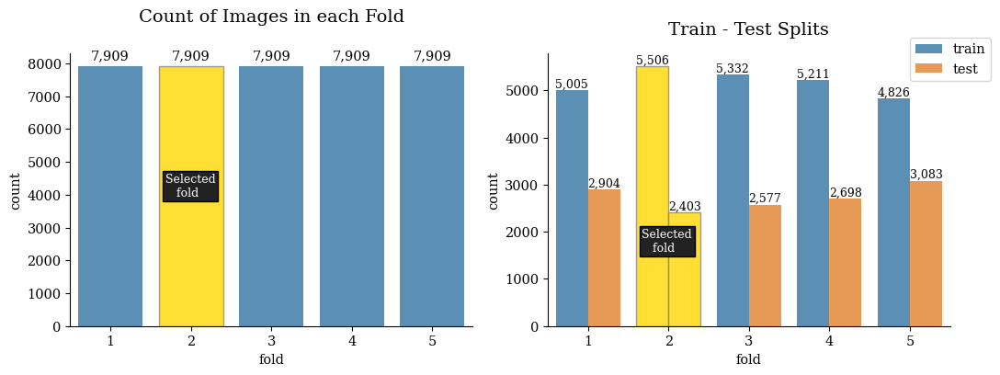

In [4]:
selected_fold = 2
selected_fold_data = fold_info.query("fold == @selected_fold")\
                              .copy().reset_index(drop=True)
selected_fold_data["filename"] = ("D:/下载/archive (2)/BreaKHis_v1/"
                                  + selected_fold_data["filename"])
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(11, 4.2), tight_layout=True)
# Plot image count in each fold
sb.countplot(data=fold_info, x="fold", color="C0", ax=ax1, alpha=0.8)
bars = ax1.containers[0]
ax1.bar_label(bars, padding=3,
             labels=[f"{x:,.0f}" for x in bars.datavalues])
_selected_bar = bars[selected_fold - 1]
_selected_bar.set_facecolor("gold")
_selected_bar.set_edgecolor("#888")
ax1.text(_selected_bar.get_x() + 0.08, _selected_bar.get_height() / 2,
         "Selected\n   fold", size=9, color="#fff",
         bbox={"pad": 2, "facecolor": "#222"})
ax1.set_title("Count of Images in each Fold", size=14, pad=25)

# Plot train-test split
sb.countplot(data=fold_info, x="fold", hue="grp", palette="tab10",
              ax=ax2, alpha=0.8)
for bars in ax2.containers:
    ax2.bar_label(bars, [f"{x:,.0f}" for x in bars.datavalues], size=9)
    bars[selected_fold - 1].set_facecolor("gold")
    bars[selected_fold - 1].set_edgecolor("#888")
ax2.text(_selected_bar.get_x() + 0.07, _selected_bar.get_height() / 5,
         "Selected\n   fold", size=9, color="#fff",
         bbox={"pad": 2, "facecolor": "#222"})
ax2.set_title("Train - Test Splits", size=14, pad=15)
ax2.legend(loc=(0.9, 0.9));

Magnification factors

established that training models on images with magnification factor at least 200X yields the best results.

Consider the following images from slide 22549AB at different magnification factors:

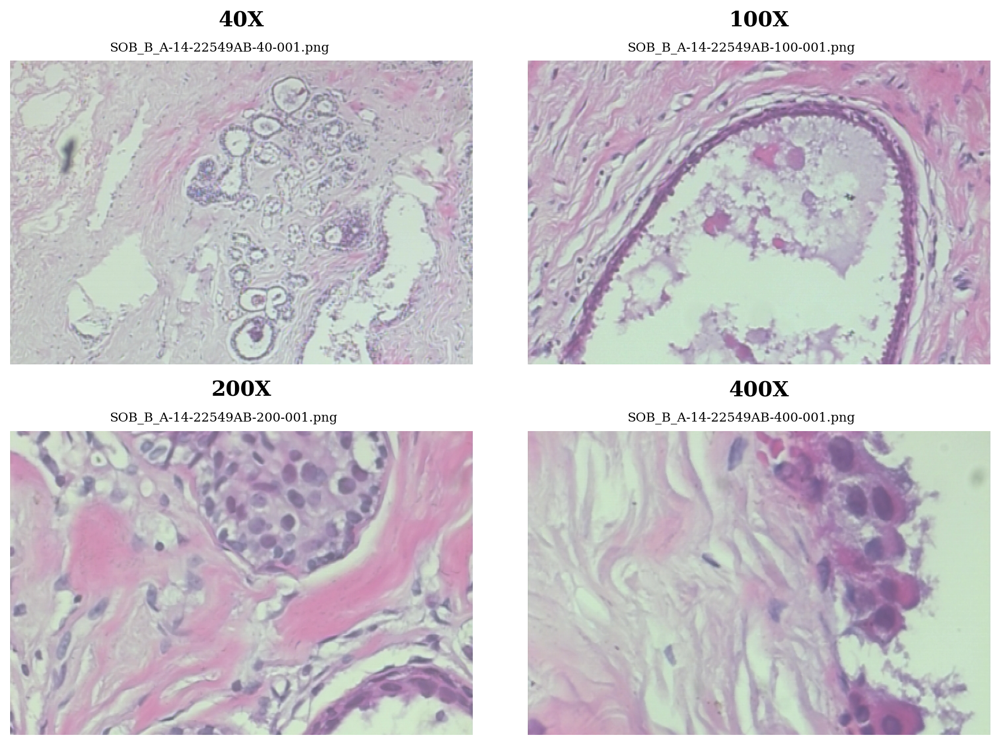

In [5]:
fig, axes = plt.subplots(2, 2, figsize=(11, 7.5), dpi=180, tight_layout=True)
sample_images = selected_fold_data.groupby("mag", as_index=False).first()
for ax, row in zip(axes.flat, sample_images.itertuples()):
    img = Image.open(row.filename)
    ax.imshow(img)
    ax.set_title(f"{row.mag}X", size=15, pad=25, weight=600)
    ax.text(150, -15, row.filename.split("/")[-1], size=9)
    ax.axis("off")

### Image Validation

Checking for dark, light, odd_aspect_ratio, low_information, exact_duplicates, near_duplicates, blurry, grayscale, odd_size images ...


  0%|          | 0/7909 [00:00<?, ?it/s]

  0%|          | 0/7909 [00:00<?, ?it/s]

Issue checks completed. 330 issues found in the dataset. To see a detailed report of issues found, use imagelab.report().
Issues found in images in order of severity in the dataset

|    | issue_type       |   num_images |
|---:|:-----------------|-------------:|
|  0 | exact_duplicates |          250 |
|  1 | odd_size         |           74 |
|  2 | near_duplicates  |            6 |
|  3 | blurry           |            0 |
|  4 | dark             |            0 |
|  5 | grayscale        |            0 |
|  6 | light            |            0 |
|  7 | low_information  |            0 |
|  8 | odd_aspect_ratio |            0 | 

----------------- exact_duplicates images ------------------

Number of examples with this issue: 250
Examples representing most severe instances of this issue:

Set: 0


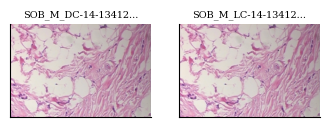

Set: 1


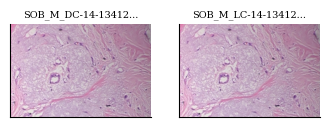

Set: 2


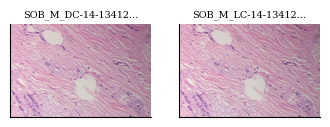

Set: 3


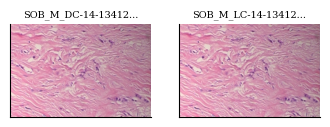

--------------------- odd_size images ----------------------

Number of examples with this issue: 74
Examples representing most severe instances of this issue:



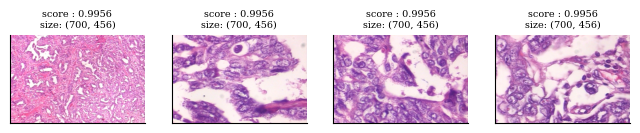

------------------ near_duplicates images ------------------

Number of examples with this issue: 6
Examples representing most severe instances of this issue:

Set: 0


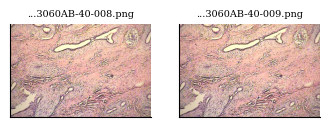

Set: 1


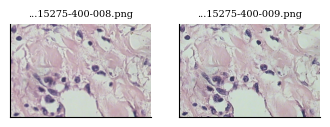

Set: 2


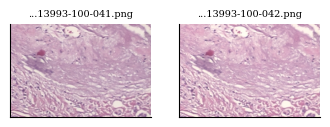

In [6]:

imagelab = Imagelab(filepaths=list(selected_fold_data["filename"]))
imagelab.find_issues()
imagelab.report(verbosity=4)

In [7]:
duplicated_images = imagelab.issues[
    ["is_exact_duplicates_issue", "is_near_duplicates_issue"]
].any(axis=1).reset_index().rename(columns={"index": "filename", 0: "duplicated"})
duplicated_images.head()

,filename,duplicated
0,D:/下载/archive (2)/BreaKHis_v1/BreaKHis_v1/hist...,False
1,D:/下载/archive (2)/BreaKHis_v1/BreaKHis_v1/hist...,False
2,D:/下载/archive (2)/BreaKHis_v1/BreaKHis_v1/hist...,False
3,D:/下载/archive (2)/BreaKHis_v1/BreaKHis_v1/hist...,False
4,D:/下载/archive (2)/BreaKHis_v1/BreaKHis_v1/hist...,False


In [8]:
# Check that filenames align
assert duplicated_images["filename"].equals(selected_fold_data["filename"])

# Drop all duplicated images, then validate again 
selected_fold_data = selected_fold_data[~duplicated_images["duplicated"]]
imagelab = Imagelab(filepaths=list(selected_fold_data["filename"]))
imagelab.find_issues()

Checking for dark, light, odd_aspect_ratio, low_information, exact_duplicates, near_duplicates, blurry, grayscale, odd_size images ...


  0%|          | 0/7653 [00:00<?, ?it/s]

  0%|          | 0/7653 [00:00<?, ?it/s]

Issue checks completed. 74 issues found in the dataset. To see a detailed report of issues found, use imagelab.report().


In [9]:
# Use data in selected fold (2) with magnification factor >= 200X
train = selected_fold_data.query("mag >= 200 and grp == 'train'")
test = selected_fold_data.query("mag >= 200 and grp == 'test'")
train.shape, test.shape

((2566, 5), (1149, 5))

### Distribution

Malignant cases account for a large proportion

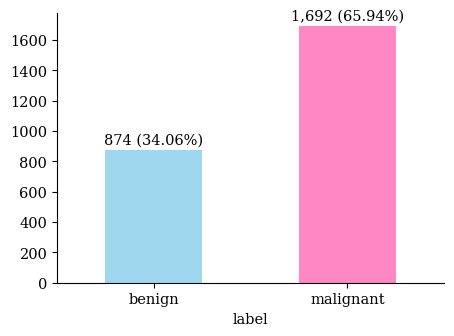

In [10]:
classes = dict(benign=0, malignant=1)
class_names = list(classes.keys())
label_counts = train["label"].value_counts(ascending=True)
ax = label_counts.plot.bar(color=["skyblue", "hotpink"], alpha=0.8,
                           figsize=(5, 3.5))
ax.bar_label(ax.containers[0], padding=2,
             labels=[f"{x:,} ({x/len(train):.2%})" for x in label_counts])
ax.set_xticklabels(["benign", "malignant"], rotation=0);

Accuracy is less reliable when there is a class imbalance in a classification problem, because it is easy to get high accuracy just by predicting a large number of major classes.

In [11]:
y = train["label"].map(classes)
positive_only_preds = np.ones_like(y)
print(f"Accuracy: {metrics.accuracy_score(y, positive_only_preds):.2%}",
      f"\nROC-AUC:  {metrics.roc_auc_score(y, positive_only_preds):.2%}")

Accuracy: 65.94% 
ROC-AUC:  50.00%


👆If there is a classifier that only predicts that all samples are malignant (labeled 1), even if it never correctly identifies any benign cases (labeled 0), it can achieve 65.94% accuracy. This is because malignant cases accounted for 65.94% of the data, so the accuracy rate can reach this value even if the classifier does not have any distinguishing ability and only classifies all cases as malignant.

However, the ROC-AUC (the area under the receiver's operating characteristic curve) score for such a model would be only 50%. A ROC-AUC value of 50% indicates that the model does not predict better than a random guess, that is, it has no practical utility for distinguishing between malignant and benign cases. This shows that accuracy alone is not enough to evaluate model performance in the case of class imbalance, and more complex indicators, such as ROC-AUC, are needed to evaluate the model's predictive ability more comprehensively.

Therefore, use ROC-AUC and a confusion matrix for model evaluation.

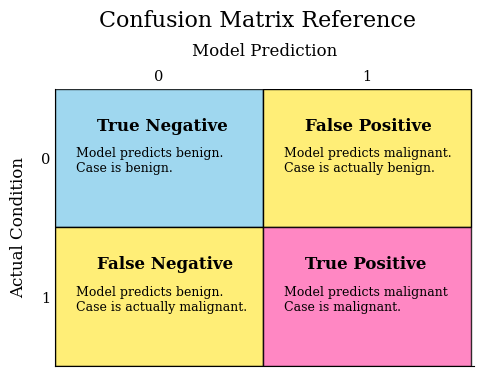

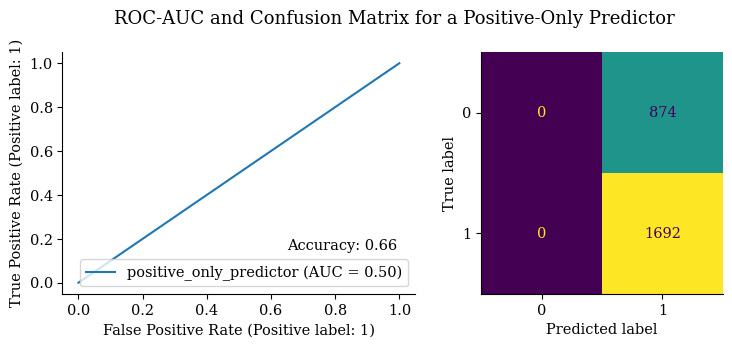

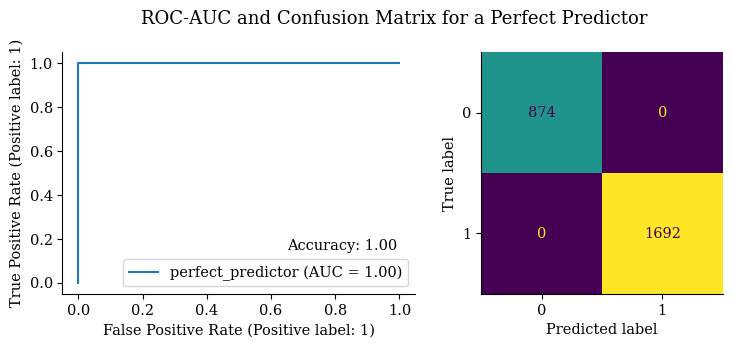

In [12]:
# Draw a confusion matrix with descriptions
fig, ax = plt.subplots(figsize=(5.4, 3.6))
ax.axvspan(0, 0.5, 0.5, 1, facecolor="skyblue", alpha=0.8, edgecolor="black")
ax.axvspan(0.5, 1, 0.5, 1, facecolor="#fe7", edgecolor="black")
ax.axvspan(0, 0.5, 0, 0.5, facecolor="#fe7", edgecolor="black")
ax.axvspan(0.5, 1, 0, 0.5, facecolor="hotpink", alpha=0.8, edgecolor="black")
ax.text(0.1, 0.85, "True Negative", size=12, weight=600)
ax.text(0.05, 0.7, "Model predicts benign.\nCase is benign.", size=9)
ax.text(0.6, 0.85, "False Positive", size=12, weight=600)
ax.text(0.55, 0.7, "Model predicts malignant.\nCase is actually benign.", size=9)
ax.text(0.1, 0.35, "False Negative", size=12, weight=600)
ax.text(0.05, 0.2, "Model predicts benign.\nCase is actually malignant.", size=9)
ax.text(0.6, 0.35, "True Positive", size=12, weight=600)
ax.text(0.55, 0.2, "Model predicts malignant\nCase is malignant.", size=9)
ax.set_xlim(0, 1.005)
ax.xaxis.set_major_locator(ticker.FixedLocator([0.25, 0.75]))
ax.xaxis.set_ticklabels([0, 1])
ax.yaxis.set_major_locator(ticker.FixedLocator([0.25, 0.75]))
ax.yaxis.set_ticklabels([1, 0])
ax.set_ylabel("Actual Condition", size=12, labelpad=10)
ax.set_xlabel("Model Prediction", size=12, labelpad=10)
ax.xaxis.set_label_position("top")
ax.xaxis.set_ticks_position("top")
ax.spines["left"].set_position("zero")
ax.tick_params(pad=0, top=False, left=False)
fig.suptitle("Confusion Matrix Reference", y=1.1, size=16)

# Plot metrics for positive-only-predictor
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(8, 3.5), tight_layout=True)
metrics.RocCurveDisplay.from_predictions(y, positive_only_preds, ax=ax1,
                                         name="positive_only_predictor")
metrics.ConfusionMatrixDisplay.from_predictions(y, positive_only_preds,
                                                ax=ax2, colorbar=False)
ax1.text(0.65, 0.15,
         f"Accuracy: {metrics.accuracy_score(y, positive_only_preds):.2f}")
fig.suptitle("ROC-AUC and Confusion Matrix for a Positive-Only Predictor", size=13)

# Plot metrics for "perfect" predictor
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(8, 3.5), tight_layout=True)
metrics.RocCurveDisplay.from_predictions(y, y, ax=ax1, name="perfect_predictor")
ax1.text(0.65, 0.15, f"Accuracy: {metrics.accuracy_score(y, y):.2f}")
metrics.ConfusionMatrixDisplay.from_predictions(y, y, ax=ax2, colorbar=False)
fig.suptitle("ROC-AUC and Confusion Matrix for a Perfect Predictor", size=13);

### Data Ingestion & Preprocessing
Images need to be converted into numeric form for consumption by computer vision models.

We'll use the tensorflow image module to:

load the PNG image files
decode the images and convert them to 3D tensors
resize the images to a uniform size (some have 760x460 pixels while some have 760x456).

In [13]:
IMG_SIZE = 224
BATCH_SIZE = 28


#def load_image(filename: str, label: int) -> Tuple[tf.Tensor, str]:
    #file = tf.io.read_file(filename)
    #img = tf.image.decode_png(file, channels=3)
    #img = tf.image.resize_with_pad(img, IMG_SIZE, IMG_SIZE)
    #return img, label

def load_image(filename: str, label: int) -> Tuple[tf.Tensor, str]:
    file = tf.io.read_file(filename)
    img = tf.image.decode_png(file, channels=3)
    img = tf.image.resize_with_pad(img, IMG_SIZE, IMG_SIZE)
    # 添加数据增强
    img = tf.image.random_flip_left_right(img)  # 随机左右翻转
    img = tf.image.random_brightness(img, max_delta=0.1)  # 随机调整亮度
    img = tf.image.random_contrast(img, lower=0.8, upper=1.2)  # 随机调整对比度
    return img, label



# Prepare training and validation datasets
X_train, X_valid, y_train, y_valid = train_test_split(
    train["filename"], train["label"].map(classes), random_state=SEED
)
train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))\
             .map(load_image).batch(BATCH_SIZE)
validation_ds = tf.data.Dataset.from_tensor_slices((X_valid, y_valid))\
                  .map(load_image).batch(BATCH_SIZE)
# Prepare test dataset
test = test.sample(frac=1, random_state=SEED)  # shuffle test data
test_ds = tf.data.Dataset.from_tensor_slices(
    (test["filename"], test["label"].map(classes))
).map(load_image).batch(BATCH_SIZE)

# Cache and prefetch data for faster training
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
validation_ds = validation_ds.cache().prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)

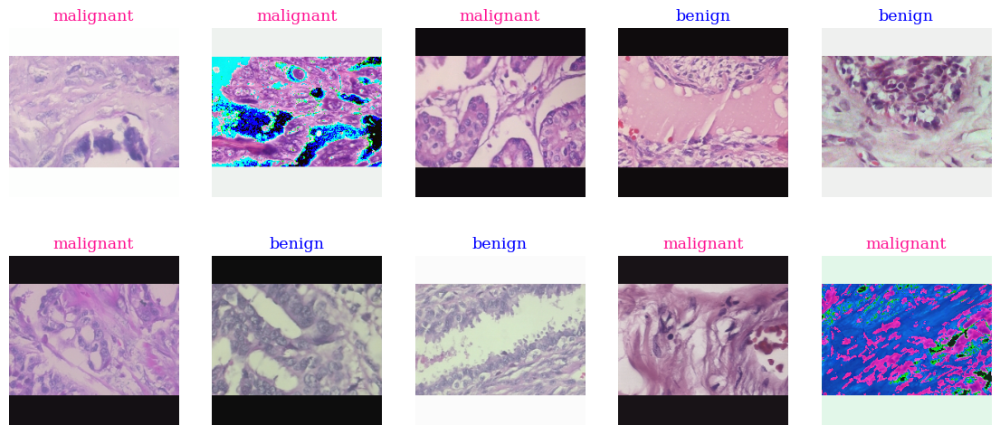

In [14]:
#have a look at some of the image
plt.figure(figsize=(14, 6))
for images, labels in train_ds.take(1):
    labels = labels.numpy()    
    for i in range(10):
        ax = plt.subplot(2, 5, i + 1)
        plt.imshow(images[i].numpy().astype(np.uint8))
        label = class_names[labels[i]]
        title_color = "blue" if label == "benign" else "deeppink"
        plt.title(class_names[labels[i]], color=title_color)
        plt.axis("off")

### Data Augmentation

In [15]:
sample_image = load_image(*train[["filename", "label"]].iloc[0])[0]


def plot_augmentations(augmentation_layer: tf.keras.layers.Layer) -> None:
    augment_name = augmentation_layer.name
    fig, (ax0, *axes) = plt.subplots(ncols=4, figsize=(15, 4))
    ax0.imshow(sample_image.numpy().astype("uint8"))
    ax0.set_title("Original", size=14, pad=10)
    ax0.axis("off")
    for idx, ax in enumerate(axes):
        augmented_image = augmentation_layer(sample_image)
        ax.imshow(augmented_image.numpy().astype("uint8"))
        ax.set_title(augment_name.title(), size=14, pad=10)
        ax.axis("off")

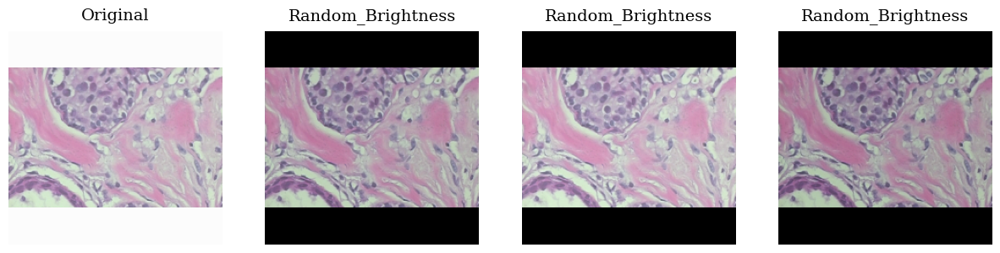

In [16]:
plot_augmentations(layers.RandomBrightness(0.2))

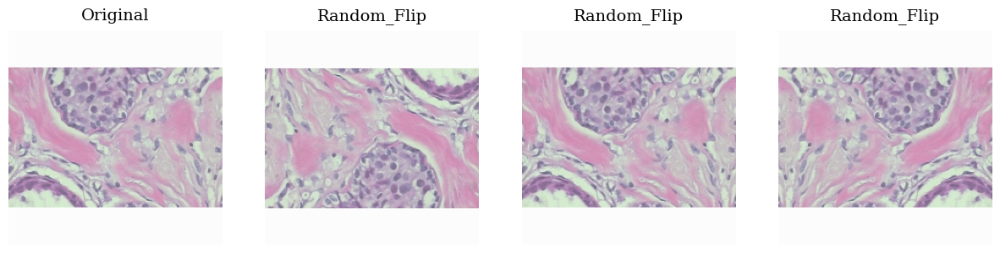

In [17]:
plot_augmentations(layers.RandomFlip())

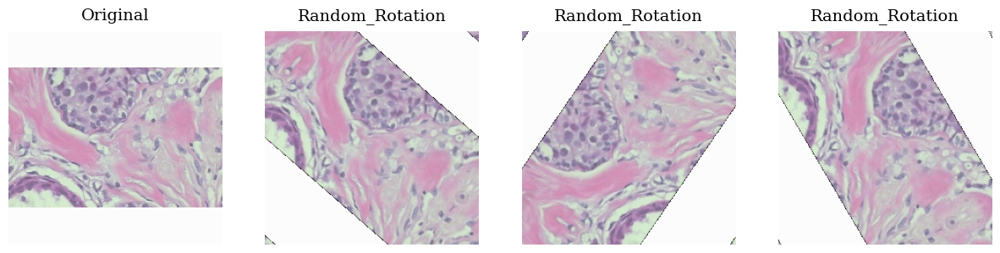

In [18]:
plot_augmentations(layers.RandomRotation(0.2, seed=SEED))

### Helper functions

In [19]:
MAX_EPOCHS = 25
BASE_LEARNING_RATE = 0.001


def compile_and_fit_model(
    model: tf.keras.Model,
    learning_rate: float=BASE_LEARNING_RATE,
    epochs: int=MAX_EPOCHS
) -> tf.keras.callbacks.History:
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate),
        loss=tf.keras.losses.BinaryCrossentropy(),
        metrics=[tf.keras.metrics.AUC(name="roc_auc"), "binary_accuracy"]
    )
    early_stopping = EarlyStopping(min_delta=1e-4, patience=5, verbose=1,
                                   restore_best_weights=True)
    reduce_lr = ReduceLROnPlateau(factor=0.5, patience=4, verbose=1)
    history = model.fit(train_ds, validation_data=validation_ds,
                        epochs=epochs, callbacks=[early_stopping, reduce_lr])
    # Plot training metrics
    performance_df = pd.DataFrame(history.history)
    fig, axes = plt.subplots(ncols=2, figsize=(11, 4))
    for ax, metric in zip(axes.flat, ["Accuracy", "Loss"]):
        performance_df.filter(like=metric.lower()).plot(ax=ax)
        ax.set_title(metric, size=14, pad=10)
        ax.set_xlabel("epoch")
    return history


def evaluate_model(model: tf.keras.Model, dataset: tf.data.Dataset=test_ds) -> None:
    loss, auc, accuracy = model.evaluate(dataset, verbose=0)
    print(f"\nROC-AUC:   {auc:.5f}", 
          f"Accuracy:  {accuracy:.5f}",
          f"Loss:      {loss:.5f}\n", sep="\n")
    # Get labels and predictions for each batch in dataset
    results = [(labels, model.predict(images, verbose=0).reshape(-1))
               for images, labels in dataset.take(-1)]
    labels = np.concatenate([x[0] for x in results])
    preds = np.concatenate([x[1] for x in results])
    # Plot metrics
    fig, axes = plt.subplots(ncols=3, figsize=(15, 4), dpi=160)
    curves = [metrics.RocCurveDisplay, metrics.PrecisionRecallDisplay]
    for ax, curve in zip(axes[:2], curves):
        curve.from_predictions(labels, preds, ax=ax, name=model.name)
    metrics.ConfusionMatrixDisplay.from_predictions(
        labels, preds.round().astype("uint8"), ax=axes[2], colorbar=False,
    )
    titles = ["ROC-AUC Curve", "Precision-Recall Curve", "Confusion Matrix"]
    for ax, title in zip(axes.flat, titles):
        ax.set_title(title, size=14, pad=10)


def plot_predictions(model: tf.keras.Model) -> None:
    plt.figure(figsize=(14, 9))
    for images, labels in test_ds.take(1):
        labels = labels.numpy()
        predicted_labels = model.predict(images).round().astype("uint8").reshape(-1,)
        print("Predicted:", predicted_labels)
        print("Actual:   ", labels)
        for i, (pred, actual) in enumerate(zip(predicted_labels, labels)):
            ax = plt.subplot(4, 7, i + 1)
            plt.imshow(images[i].numpy().astype("uint8"))
            if pred == actual:
                plt.title(class_names[labels[i]], color="green", size=9)
            else:
                plt.title(f"{class_names[predicted_labels[i]]}\n"
                          + f"(Actual: {class_names[labels[i]]})",
                          color="red", size=9)
            plt.axis("off")

### Custom Convolutional Neural Network

In [20]:
# custom_model = tf.keras.Sequential([
    #layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3)),
    # Data augmentation
    #layers.RandomBrightness(0.2, seed=SEED),
    #layers.RandomFlip(seed=SEED),
    #layers.RandomRotation(0.2, seed=SEED),
    # Convolutional block I
    #layers.Rescaling(1./255),
    #layers.BatchNormalization(),
    #layers.Conv2D(32, 3, activation="relu"),
    #layers.MaxPooling2D(),
    # Convolutional block II
    #layers.Conv2D(64, 3, activation="relu"),
    #layers.MaxPooling2D(),
    # Convolutional block III
    #layers.Conv2D(128, 3, activation="relu"),
    #layers.MaxPooling2D(),
    # Fully connected layers
    #layers.GlobalAveragePooling2D(),
    #layers.Dropout(0.4),
    #layers.Dense(256, activation="relu"),
    #layers.Dropout(0.3),
    #layers.Dense(32, activation="relu"),
    #layers.Dropout(0.2),
    #layers.Dense(1, activation="sigmoid")
#], name="CustomCNN")
#custom_model.summary()

custom_model = tf.keras.Sequential([
    layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3)),
    # 数据增强层保持不变
    layers.RandomBrightness(0.2, seed=SEED),
    layers.RandomFlip(seed=SEED),
    layers.RandomRotation(0.2, seed=SEED),

    # 卷积块 I
    layers.Rescaling(1./255),
    layers.Conv2D(32, 3, padding='same', activation="relu"),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),

    # 卷积块 II
    layers.Conv2D(64, 3, padding='same', activation="relu"),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),

    # 卷积块 III
    layers.Conv2D(128, 3, padding='same', activation="relu"),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),

    # 新增加一个卷积块 IV
    layers.Conv2D(256, 3, padding='same', activation="relu"),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),

    # 全局平均池化层
    layers.GlobalAveragePooling2D(),

    # 全连接层与 Dropout 层
    layers.Dropout(0.5),  # 增加 Dropout 率以减少过拟合
    layers.Dense(256, activation="relu"),
    layers.Dropout(0.5),  # 增加 Dropout 率
    layers.Dense(64, activation="relu"),  # 增加一个中间层以增强模型的表达能力
    layers.Dropout(0.3),
    layers.Dense(1, activation="sigmoid")
], name="CustomCNN")

# 打印模型概览
custom_model.summary()


Model: "CustomCNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ random_brightness_1             │ (None, 224, 224, 3)    │             0 │
│ (RandomBrightness)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_flip_1 (RandomFlip)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_rotation_1               │ (None, 224, 224, 3)    │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │        16,448 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 472,641 (1.80 MB)

 Trainable params: 471,681 (1.80 MB)

 Non-trainable params: 960 (3.75 KB)

Epoch 1/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 108s 1s/step - binary_accuracy: 0.7553 - loss: 0.5301 - roc_auc: 0.7968 - val_binary_accuracy: 0.6495 - val_loss: 1.2888 - val_roc_auc: 0.8500 - learning_rate: 0.0010
Epoch 2/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 111s 2s/step - binary_accuracy: 0.8301 - loss: 0.4374 - roc_auc: 0.8727 - val_binary_accuracy: 0.6495 - val_loss: 0.6913 - val_roc_auc: 0.8765 - learning_rate: 0.0010
Epoch 3/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 110s 2s/step - binary_accuracy: 0.8383 - loss: 0.4164 - roc_auc: 0.8766 - val_binary_accuracy: 0.6495 - val_loss: 1.3939 - val_roc_auc: 0.7229 - learning_rate: 0.0010
Epoch 4/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 112s 2s/step - binary_accuracy: 0.8491 - loss: 0.3996 - roc_auc: 0.8874 - val_binary_accuracy: 0.6526 - val_loss: 0.9012 - val_roc_auc: 0.8847 - learning_rate: 0.0010
Epoch 5/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 112s 2s/step - binary_accuracy: 0.8594 - loss: 0.3770 - roc_auc: 0.8987 - val_binary_accuracy: 0.8053 - val_loss: 0.4518 - val_roc_auc: 0.8548

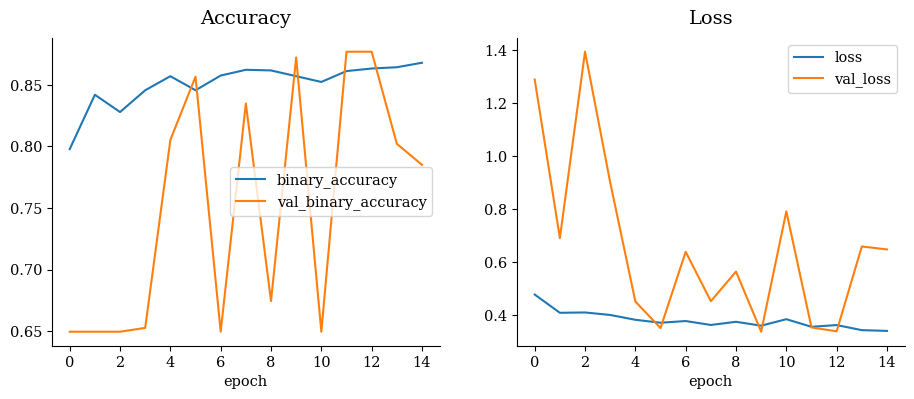

In [21]:
custom_history = compile_and_fit_model(custom_model)


ROC-AUC:   0.89401
Accuracy:  0.86162
Loss:      0.38572



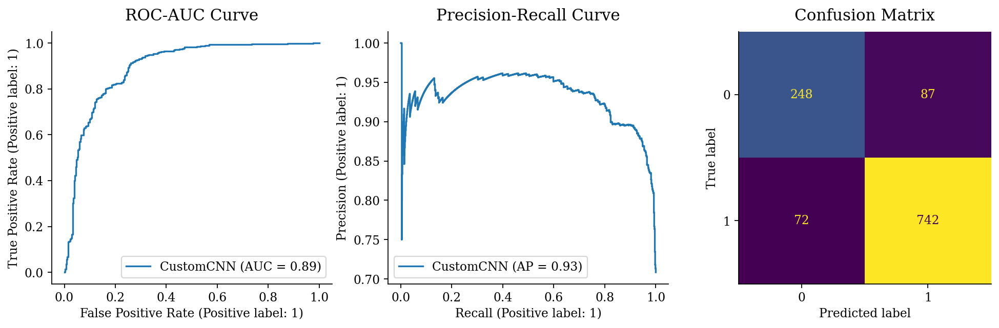

In [22]:
evaluate_model(custom_model)

performance is quite good for a light-weight CNN trained on limited data

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step
Predicted: [1 1 1 0 1 1 0 1 1 1 1 0 1 1 0 1 0 1 1 1 1 1 1 1 0 1 1 1]
Actual:    [1 1 0 0 1 1 0 1 1 1 1 0 1 1 0 1 0 1 0 0 1 1 1 1 1 0 1 1]


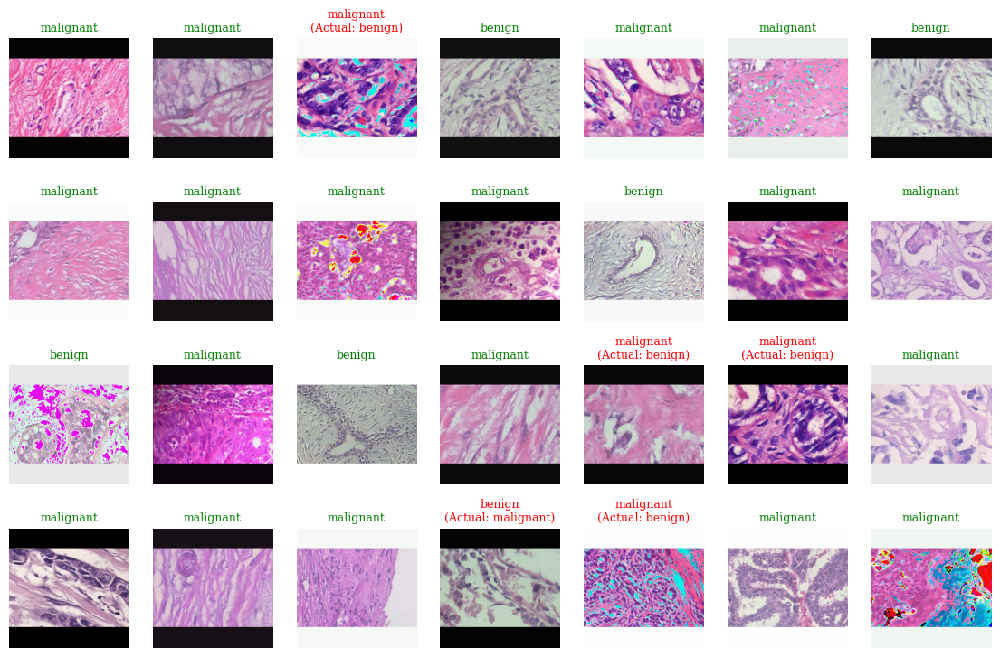

In [23]:
plot_predictions(custom_model)

Transfer learning

some of the most popular model architectures perform on this dataset:

Model with MobileNetV3 base

In [24]:
pretrained_mobnet_base = tf.keras.applications.MobileNetV3Large(
    include_top=False,
    input_shape=(IMG_SIZE, IMG_SIZE, 3),
    weights="imagenet",
    pooling="avg",
)
pretrained_mobnet_base.trainable = False

mobnet_model = tf.keras.Sequential([
    layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3)),
    # Data augmentation
    layers.RandomBrightness(0.2, seed=SEED),
    layers.RandomFlip(seed=SEED),
    layers.RandomRotation(0.2, seed=SEED),
    # MobileNet
    layers.Lambda(tf.keras.applications.mobilenet_v3.preprocess_input),
    pretrained_mobnet_base,
    layers.Dropout(0.4),
    # Fully connected layers
    layers.Dense(256, activation="relu"),
    layers.Dropout(0.3),
    layers.Dense(32, activation="relu"),
    layers.Dropout(0.2),
    layers.Dense(1, activation="sigmoid")
], name="MobileNetV3")
mobnet_model.summary()

Model: "MobileNetV3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ random_brightness_2             │ (None, 224, 224, 3)    │             0 │
│ (RandomBrightness)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_flip_2 (RandomFlip)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_rotation_2               │ (None, 224, 224, 3)    │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lambda (Lambda)                 │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MobilenetV3large (Functional)   │ (None, 960)            │     2,996,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 960)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 256)            │       246,016 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 32)             │         8,224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,250,625 (12.40 MB)

 Trainable params: 254,273 (993.25 KB)

 Non-trainable params: 2,996,352 (11.43 MB)

Epoch 1/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 53s 643ms/step - binary_accuracy: 0.6507 - loss: 0.6770 - roc_auc: 0.6437 - val_binary_accuracy: 0.7368 - val_loss: 0.5267 - val_roc_auc: 0.7925 - learning_rate: 0.0010
Epoch 2/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 43s 622ms/step - binary_accuracy: 0.7232 - loss: 0.5331 - roc_auc: 0.7786 - val_binary_accuracy: 0.7617 - val_loss: 0.4834 - val_roc_auc: 0.8300 - learning_rate: 0.0010
Epoch 3/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 44s 646ms/step - binary_accuracy: 0.7359 - loss: 0.5097 - roc_auc: 0.7999 - val_binary_accuracy: 0.7414 - val_loss: 0.5042 - val_roc_auc: 0.8070 - learning_rate: 0.0010
Epoch 4/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 44s 641ms/step - binary_accuracy: 0.7337 - loss: 0.5209 - roc_auc: 0.7883 - val_binary_accuracy: 0.7648 - val_loss: 0.4770 - val_roc_auc: 0.8263 - learning_rate: 0.0010
Epoch 5/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 43s 625ms/step - binary_accuracy: 0.7609 - loss: 0.4904 - roc_auc: 0.8154 - val_binary_accuracy: 0.7477 - val_loss: 0.4548 - val_roc_a

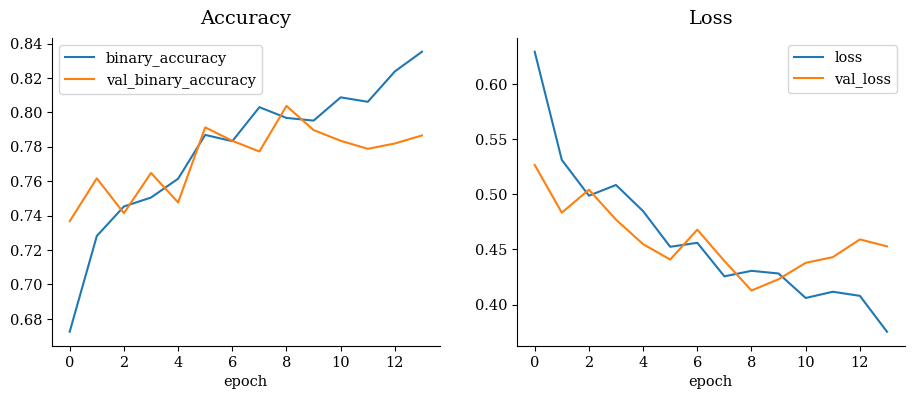

In [25]:
mobnet_history = compile_and_fit_model(mobnet_model)


ROC-AUC:   0.74807
Accuracy:  0.74500
Loss:      0.55643



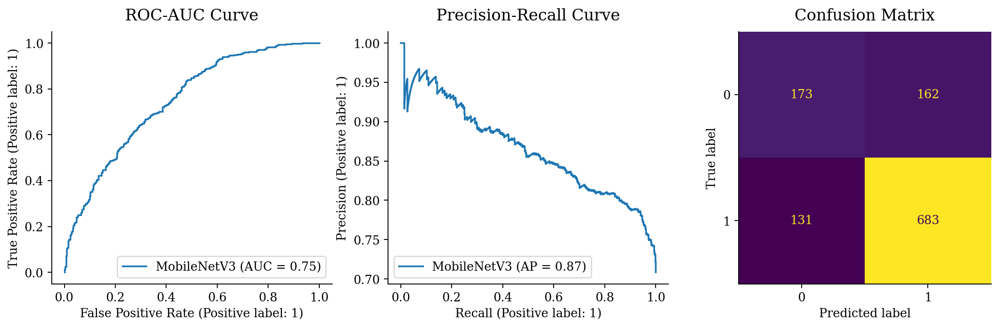

In [26]:
evaluate_model(mobnet_model)

There are a lot of false positives (190). Many healthy women would get a false alarm.↑

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step
Predicted: [1 1 1 0 1 1 0 1 1 1 1 0 1 1 1 1 0 1 1 1 1 1 1 0 0 1 0 1]
Actual:    [1 1 0 0 1 1 0 1 1 1 1 0 1 1 0 1 0 1 0 0 1 1 1 1 1 0 1 1]


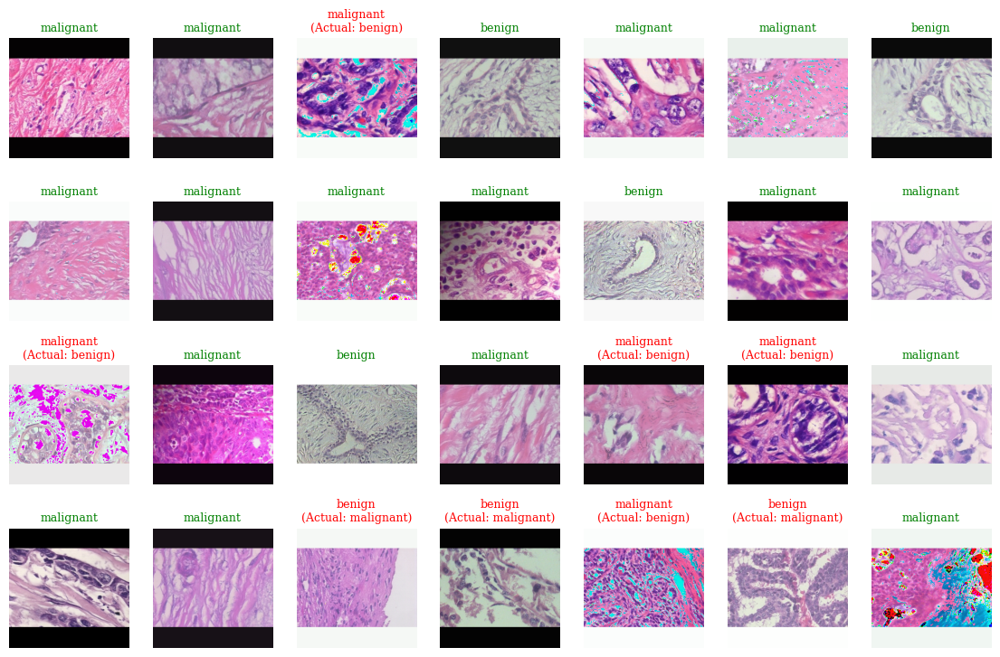

In [27]:
plot_predictions(mobnet_model)

Model with EfficientNetB1 base

In [28]:
pretrained_efficientnet_base = tf.keras.applications.efficientnet_v2.EfficientNetV2B1(
    include_top=False,
    input_shape=(IMG_SIZE, IMG_SIZE, 3),
    weights="imagenet",
    pooling="avg",
)
pretrained_efficientnet_base.trainable = False

efficientnet_model = tf.keras.Sequential([
    layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3)),
    # Data augmentation
    layers.RandomBrightness(0.2, seed=SEED),
    layers.RandomFlip(seed=SEED),
    layers.RandomRotation(0.2, seed=SEED),
    # EfficientNet
    pretrained_efficientnet_base,
    layers.Dropout(0.4),
    # Fully connected layers
    layers.Dense(256, activation="relu"),
    layers.Dropout(0.3),
    layers.Dense(32, activation="relu"),
    layers.Dropout(0.2),
    layers.Dense(1, activation="sigmoid")
], name="EfficientNetB1")
efficientnet_model.summary()

Model: "EfficientNetB1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ random_brightness_3             │ (None, 224, 224, 3)    │             0 │
│ (RandomBrightness)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_flip_3 (RandomFlip)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_rotation_3               │ (None, 224, 224, 3)    │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b1 (Functional)  │ (None, 1280)           │     6,931,124 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 32)             │         8,224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,267,317 (27.72 MB)

 Trainable params: 336,193 (1.28 MB)

 Non-trainable params: 6,931,124 (26.44 MB)

Epoch 1/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 87s 976ms/step - binary_accuracy: 0.6845 - loss: 0.6031 - roc_auc: 0.6761 - val_binary_accuracy: 0.8115 - val_loss: 0.4263 - val_roc_auc: 0.8953 - learning_rate: 0.0010
Epoch 2/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 64s 923ms/step - binary_accuracy: 0.8019 - loss: 0.4387 - roc_auc: 0.8620 - val_binary_accuracy: 0.7461 - val_loss: 0.4576 - val_roc_auc: 0.9168 - learning_rate: 0.0010
Epoch 3/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 63s 915ms/step - binary_accuracy: 0.8212 - loss: 0.4089 - roc_auc: 0.8718 - val_binary_accuracy: 0.8302 - val_loss: 0.3391 - val_roc_auc: 0.9329 - learning_rate: 0.0010
Epoch 4/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 63s 914ms/step - binary_accuracy: 0.8303 - loss: 0.3858 - roc_auc: 0.8889 - val_binary_accuracy: 0.8240 - val_loss: 0.3462 - val_roc_auc: 0.9266 - learning_rate: 0.0010
Epoch 5/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 63s 918ms/step - binary_accuracy: 0.8477 - loss: 0.3652 - roc_auc: 0.9011 - val_binary_accuracy: 0.7944 - val_loss: 0.3861 - val_roc_a

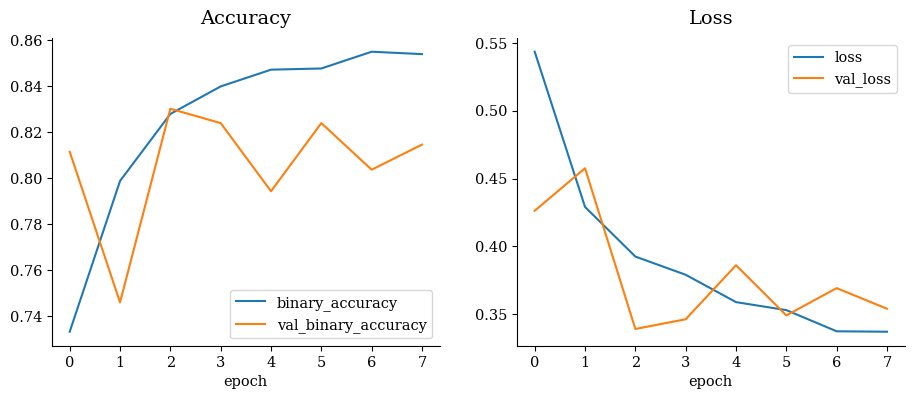

In [29]:
efficientnet_history = compile_and_fit_model(efficientnet_model)


ROC-AUC:   0.83926
Accuracy:  0.78329
Loss:      0.44844



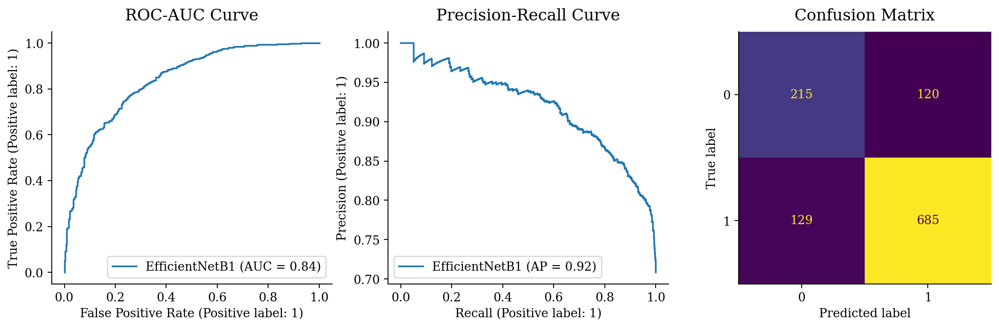

In [30]:
evaluate_model(efficientnet_model)

This model is very promising. It has attained the highest test ROC-AUC score so far

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 622ms/step
Predicted: [1 1 1 0 1 1 0 1 1 1 1 0 1 1 0 1 0 1 1 0 1 1 1 1 0 1 0 1]
Actual:    [1 1 0 0 1 1 0 1 1 1 1 0 1 1 0 1 0 1 0 0 1 1 1 1 1 0 1 1]


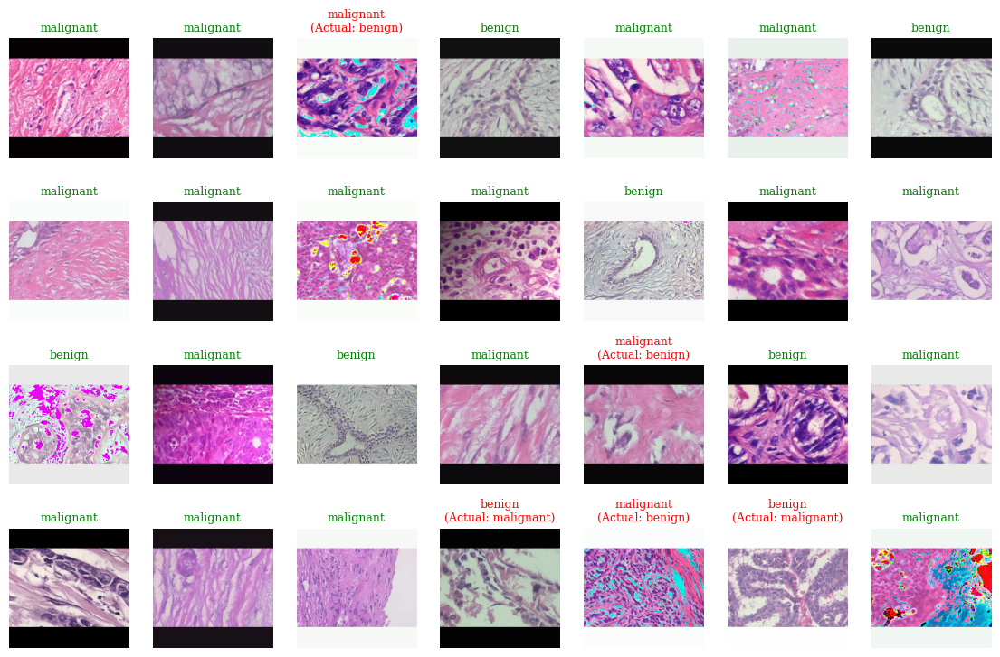

In [31]:
plot_predictions(efficientnet_model)

Model with VGG16 base

In [32]:
pretrained_vgg16_base = tf.keras.applications.vgg16.VGG16(
    include_top=False,
    input_shape=(IMG_SIZE, IMG_SIZE, 3),
    weights="imagenet",
    pooling="avg",
)
pretrained_vgg16_base.trainable = False

vgg16_model = tf.keras.Sequential([
    layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3)),
    # Data augmentation
    layers.RandomBrightness(0.2, seed=SEED),
    layers.RandomFlip(seed=SEED),
    layers.RandomRotation(0.2, seed=SEED),
    # VGG16
    layers.Lambda(tf.keras.applications.vgg16.preprocess_input),
    pretrained_vgg16_base,
    layers.Dropout(0.4),
    # Fully connected layers
    layers.Dense(384, activation="relu"),
    layers.Dropout(0.3),
    layers.Dense(64, activation="relu"),
    layers.Dropout(0.2),
    layers.Dense(1, activation="sigmoid")
], name="VGG16")
vgg16_model.summary()

Model: "VGG16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ random_brightness_4             │ (None, 224, 224, 3)    │             0 │
│ (RandomBrightness)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_flip_4 (RandomFlip)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_rotation_4               │ (None, 224, 224, 3)    │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lambda_1 (Lambda)               │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vgg16 (Functional)              │ (None, 512)            │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 384)            │       196,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 384)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 64)             │        24,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,936,385 (56.98 MB)

 Trainable params: 221,697 (866.00 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 301s 4s/step - binary_accuracy: 0.6403 - loss: 1.1465 - roc_auc: 0.6141 - val_binary_accuracy: 0.7336 - val_loss: 0.6318 - val_roc_auc: 0.7705 - learning_rate: 0.0010
Epoch 2/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 294s 4s/step - binary_accuracy: 0.6988 - loss: 0.5862 - roc_auc: 0.7169 - val_binary_accuracy: 0.7632 - val_loss: 0.5495 - val_roc_auc: 0.8668 - learning_rate: 0.0010
Epoch 3/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 293s 4s/step - binary_accuracy: 0.7173 - loss: 0.5537 - roc_auc: 0.7649 - val_binary_accuracy: 0.7913 - val_loss: 0.5439 - val_roc_auc: 0.8668 - learning_rate: 0.0010
Epoch 4/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 294s 4s/step - binary_accuracy: 0.7295 - loss: 0.5571 - roc_auc: 0.7466 - val_binary_accuracy: 0.8131 - val_loss: 0.4447 - val_roc_auc: 0.8895 - learning_rate: 0.0010
Epoch 5/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 295s 4s/step - binary_accuracy: 0.7640 - loss: 0.5359 - roc_auc: 0.7920 - val_binary_accuracy: 0.7508 - val_loss: 0.5312 - val_roc_auc: 0.9036

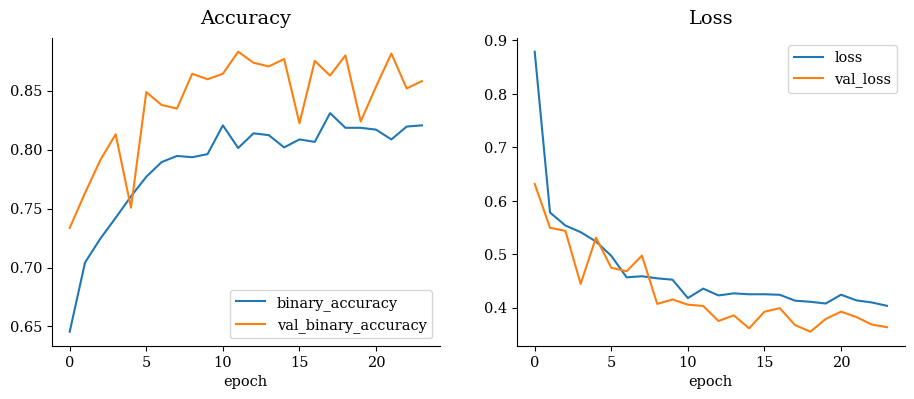

In [33]:
vgg16_history = compile_and_fit_model(vgg16_model)


ROC-AUC:   0.86838
Accuracy:  0.84247
Loss:      0.43167



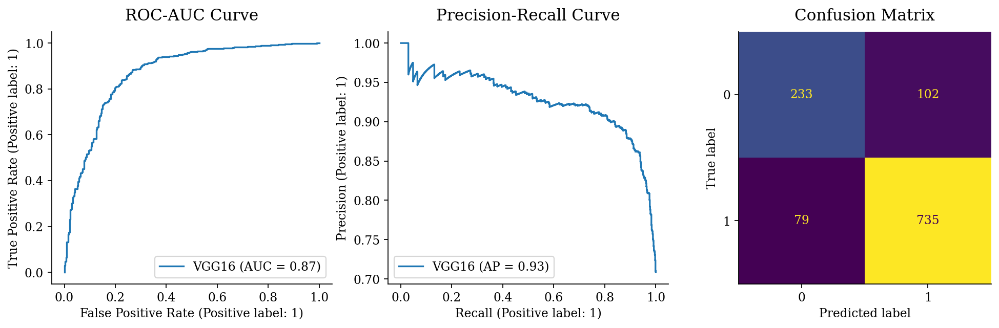

In [34]:
evaluate_model(vgg16_model)

false negatives (80). A lot of breast cancer cases could go undetected.

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Predicted: [1 1 1 0 1 1 0 1 1 1 1 0 1 1 0 1 0 1 1 0 1 1 1 1 0 1 0 1]
Actual:    [1 1 0 0 1 1 0 1 1 1 1 0 1 1 0 1 0 1 0 0 1 1 1 1 1 0 1 1]


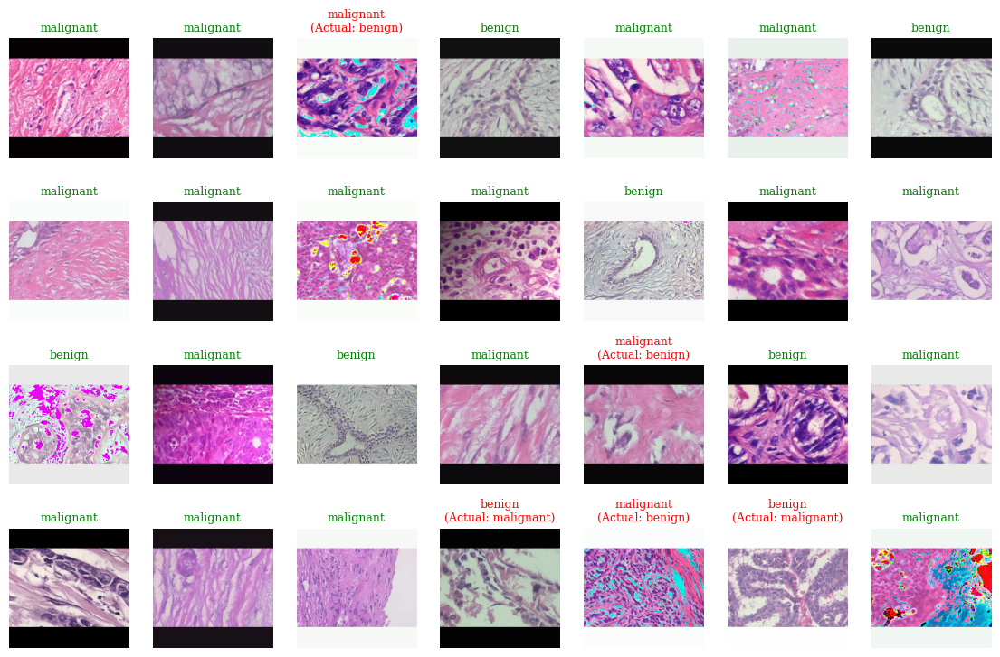

In [35]:
plot_predictions(vgg16_model)

Model with ResNet50V2 base

In [36]:
pretrained_resnet_base = tf.keras.applications.resnet_v2.ResNet50V2(
    include_top=False,
    input_shape=(IMG_SIZE, IMG_SIZE, 3),
    weights="imagenet",
    pooling="avg",
)
pretrained_resnet_base.trainable = False

resnet_model = tf.keras.Sequential([
    layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3)),
    # Data augmentation
    layers.RandomBrightness(0.2, seed=SEED),
    layers.RandomFlip(seed=SEED),
    layers.RandomRotation(0.2, seed=SEED),
    # ResNet
    layers.Lambda(tf.keras.applications.resnet_v2.preprocess_input),
    pretrained_resnet_base,
    layers.Dropout(0.4),
    # Fully connected layers
    layers.Dense(256, activation="relu"),
    layers.Dropout(0.3),
    layers.Dense(32, activation="relu"),
    layers.Dropout(0.2),
    layers.Dense(1, activation="sigmoid")
], name="ResNet50V2")
resnet_model.summary()

Model: "ResNet50V2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ random_brightness_5             │ (None, 224, 224, 3)    │             0 │
│ (RandomBrightness)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_flip_5 (RandomFlip)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_rotation_5               │ (None, 224, 224, 3)    │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lambda_2 (Lambda)               │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50v2 (Functional)         │ (None, 2048)           │    23,564,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 256)            │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 32)             │         8,224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,097,601 (91.93 MB)

 Trainable params: 532,801 (2.03 MB)

 Non-trainable params: 23,564,800 (89.89 MB)

Epoch 1/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 136s 2s/step - binary_accuracy: 0.6982 - loss: 0.6118 - roc_auc: 0.6937 - val_binary_accuracy: 0.7882 - val_loss: 0.4624 - val_roc_auc: 0.8758 - learning_rate: 0.0010
Epoch 2/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 124s 2s/step - binary_accuracy: 0.8017 - loss: 0.4506 - roc_auc: 0.8470 - val_binary_accuracy: 0.8489 - val_loss: 0.3958 - val_roc_auc: 0.8943 - learning_rate: 0.0010
Epoch 3/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 124s 2s/step - binary_accuracy: 0.7975 - loss: 0.4578 - roc_auc: 0.8398 - val_binary_accuracy: 0.8287 - val_loss: 0.4015 - val_roc_auc: 0.8973 - learning_rate: 0.0010
Epoch 4/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 125s 2s/step - binary_accuracy: 0.8330 - loss: 0.3896 - roc_auc: 0.8912 - val_binary_accuracy: 0.8271 - val_loss: 0.3917 - val_roc_auc: 0.9015 - learning_rate: 0.0010
Epoch 5/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 125s 2s/step - binary_accuracy: 0.8312 - loss: 0.3948 - roc_auc: 0.8844 - val_binary_accuracy: 0.8240 - val_loss: 0.3806 - val_roc_auc: 0.9114

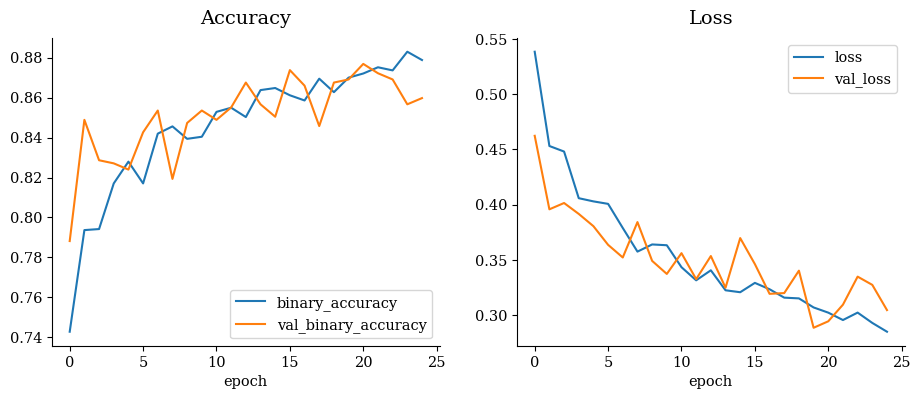

In [37]:
resnet_history = compile_and_fit_model(resnet_model)


ROC-AUC:   0.85169
Accuracy:  0.77981
Loss:      0.45977



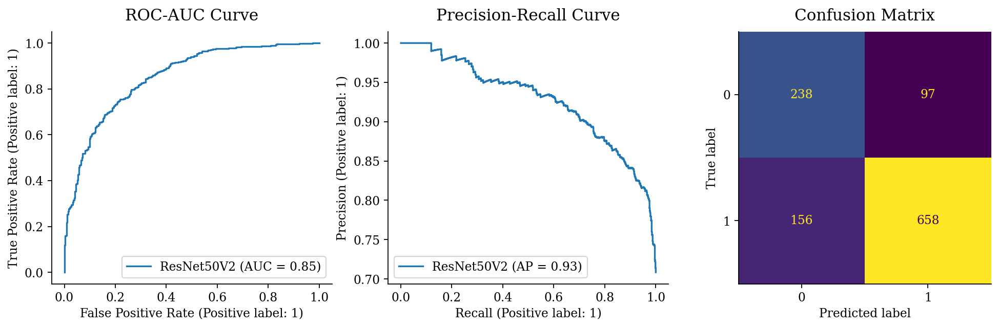

In [38]:
evaluate_model(resnet_model)

An even larger amount of false negatives (146). So many patients requiring medical attention would be deceived that they are well.

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Predicted: [1 1 1 0 1 1 0 1 1 1 0 0 1 1 0 1 0 1 1 1 1 0 1 1 0 0 0 1]
Actual:    [1 1 0 0 1 1 0 1 1 1 1 0 1 1 0 1 0 1 0 0 1 1 1 1 1 0 1 1]


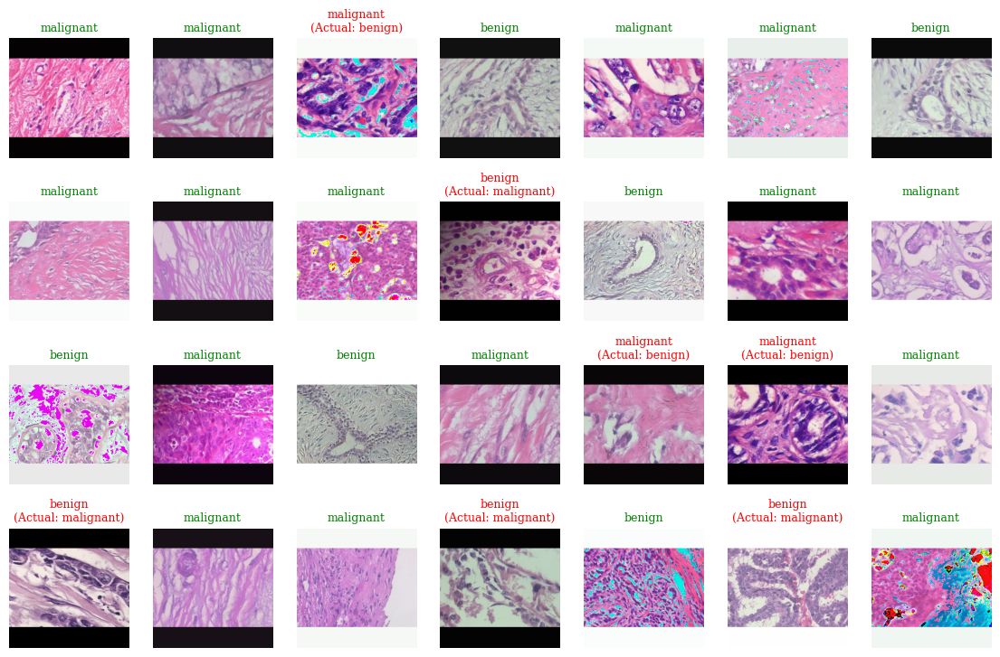

In [39]:
plot_predictions(resnet_model)

Model Evalution↓

In [40]:
fitted_models = [custom_model, mobnet_model, efficientnet_model, vgg16_model,
                 resnet_model]
test_metrics = pd.DataFrame(
    {model.name: model.evaluate(test_ds, verbose=0) for model in fitted_models},
    index=["Loss", "ROC-AUC", "Accuracy"]
)
test_metrics.style.highlight_min(color="gold", axis=None)\
                  .highlight_max(color="lawngreen", axis=None)

,CustomCNN,MobileNetV3,EfficientNetB1,VGG16,ResNet50V2
Loss,0.385723,0.556434,0.448436,0.431671,0.459767
ROC-AUC,0.894006,0.748067,0.839263,0.868380,0.851687
Accuracy,0.861619,0.744996,0.783290,0.842472,0.779809


The VGG16 model achieved the least loss (0.438626) and EfficientNetB1 model achieved the highest ROC-AUC score (0.876660) on the test dataset. ).

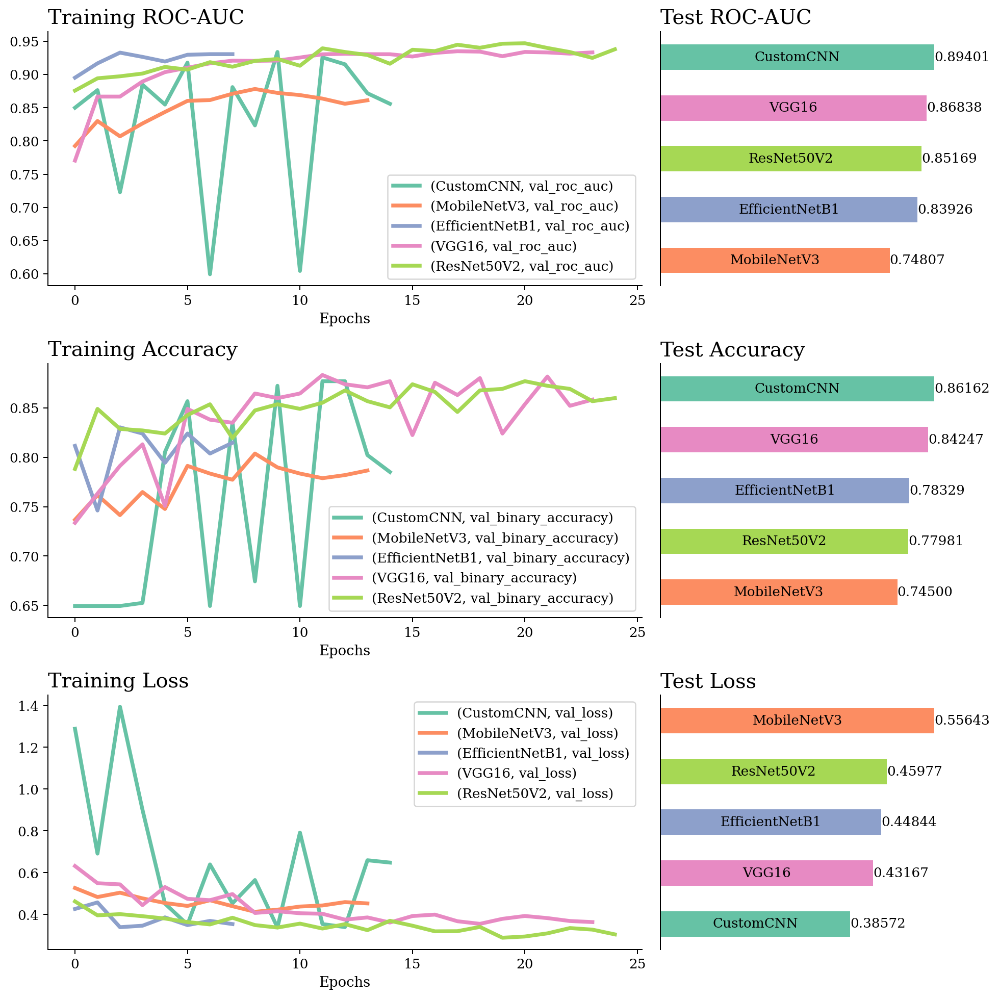

In [41]:
# Process training metrics
hist_list = [custom_history, mobnet_history, efficientnet_history,
             vgg16_history, resnet_history]
train_metrics = pd.concat([pd.DataFrame(hist.history) for hist in hist_list],
                          axis=1, keys=[hist.model.name for hist in hist_list])
train_metrics.head()
color_dict = dict(zip(test_metrics, plt.colormaps["Set2"].colors))

# Plot training and test metrics
fig, axes = plt.subplot_mosaic("\naab\nccd\neef\n", figsize=(11, 11),
                               dpi=180, tight_layout=True)
for ax, metric in zip([axes["a"], axes["c"], axes["e"]],
                      ["val_roc_auc", "val_binary_accuracy", "val_loss"]):
    data_ = train_metrics.filter(like=metric)
    data_.plot(ax=ax, lw=3, color=[color_dict[col]
                                   for col in data_.columns.levels[0]])
    ax.set_xlabel("Epochs", size=11)

for ax, metric in zip([axes["b"], axes["d"], axes["f"]],
                      ["ROC-AUC", "Accuracy", "Loss"]):
    data_ = test_metrics.loc[metric].sort_values()
    data_.plot.barh(ax=ax, color=[color_dict[col] for col in data_.index])
    ax.bar_label(ax.containers[0], [f"{x:.5f}" for x in ax.containers[0].datavalues])
    ax.bar_label(ax.containers[0], data_.index, label_type="center")
    ax.yaxis.set_visible(False)
    ax.xaxis.set_visible(False)
    ax.spines["bottom"].set_visible(False)

titles = ["Training ROC-AUC", "Test ROC-AUC", "Training Accuracy", "Test Accuracy",
          "Training Loss", "Test Loss"]
for ax, title in zip(axes.values(), titles):
    ax.set_title(title, size=16, loc="left")
    
axes["a"].legend(title="")
axes["c"].legend(title="")
axes["e"].legend(title="");

investigate if stacking can improve the results:

In [42]:
def get_predictions_and_labels(dataset: tf.data.Dataset) -> Tuple:
    # Get labels and predictions for each batch in dataset
    results = [(labels, [model.predict(images, verbose=0).reshape(-1,)
                         for model in fitted_models])
               for images, labels in dataset.take(-1)]
    labels = np.concatenate([x[0] for x in results])
    # Combine predictions, then transpose to shape (nsamples, nmodels)
    preds = np.concatenate([x[1] for x in results], axis=1).transpose()
    return preds, labels


train_preds, train_labels = get_predictions_and_labels(train_ds)
valid_preds, valid_labels = get_predictions_and_labels(validation_ds)
test_preds, test_labels = get_predictions_and_labels(test_ds)

In [43]:
stacking_model = LogisticRegressionCV(scoring="roc_auc")
stacking_model.fit(train_preds, train_labels)
stacked_preds = stacking_model.predict_proba(test_preds)

test_metrics["Stacking Ensemble"] = [
    metrics.log_loss(test_labels, stacked_preds),
    metrics.roc_auc_score(test_labels,
                          stacked_preds[:, 1]), # get stacked +ve probability
    metrics.accuracy_score(test_labels,
                           stacked_preds.argmax(axis=1)) # get stacked predicted label
]
test_metrics.style.highlight_min(color="gold", axis=None)\
                  .highlight_max(color="lawngreen", axis=None)

,CustomCNN,MobileNetV3,EfficientNetB1,VGG16,ResNet50V2,Stacking Ensemble
Loss,0.385723,0.556434,0.448436,0.431671,0.459767,0.428858
ROC-AUC,0.894006,0.748067,0.839263,0.868380,0.851687,0.894602
Accuracy,0.861619,0.744996,0.783290,0.842472,0.779809,0.840731


The stacked ensemble significantly improves the test ROC-AUC score